# Simple MultiAsset Analysis

In [2]:
import yfinance as yf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import date
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import norm
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

[*********************100%***********************]  5 of 5 completed
C:\Users\HP\AppData\Local\Temp\ipykernel_18760\2300511270.py:8: FutureWarning: The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = multi_asset_data.pct_change().dropna()


<Figure size 5000x2500 with 0 Axes>

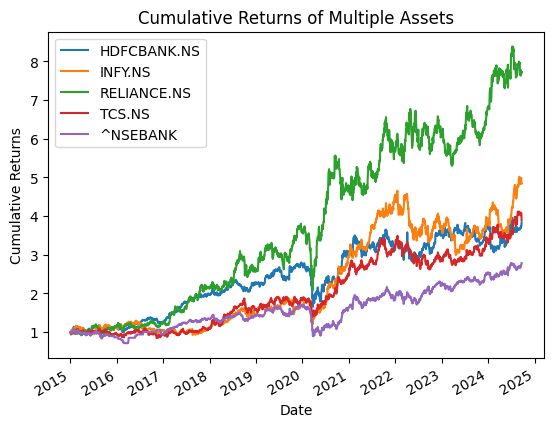

In [3]:

stocks = ['^NSEBANK', 'RELIANCE.NS', 'TCS.NS', 'HDFCBANK.NS', 'INFY.NS']


multi_asset_data = yf.download(stocks, start='2015-01-01', end=date.today())['Adj Close']


returns = multi_asset_data.pct_change().dropna()

# cumulative returns
plt.figure(figsize=(50, 25))
(1 + returns).cumprod().plot()
plt.title('Cumulative Returns of Multiple Assets')
plt.xlabel('Date')
plt.ylabel('Cumulative Returns')
plt.legend(returns.columns)
plt.show()

In [4]:
def calculate_var(returns, confidence_level, method='Historical'):
    if method == 'Historical':
        return np.percentile(returns, 100 * (1 - confidence_level))
    elif method == 'Parametric':
        mean = np.mean(returns)
        std = np.std(returns)
        return norm.ppf(1 - confidence_level, mean, std)
    elif method == 'Monte Carlo':
        simulations = 10000
        sim_returns = np.random.normal(np.mean(returns,axis=0), np.std(returns,axis=0), (simulations,returns.shape[1])) # Generate sim_returns with shape (10000, 5)
        return np.percentile(sim_returns, 100 * (1 - confidence_level),axis=0) # Calculate percentile along axis 0

#VaR 
confidence_level = 0.95
var_historical = calculate_var(returns, confidence_level, 'Historical') #var_historical is a single value now
var_parametric = calculate_var(returns, confidence_level, 'Parametric')
var_monte_carlo = calculate_var(returns, confidence_level, 'Monte Carlo')

for i,stock in enumerate(stocks):
    print(f"VaR (95%) for {stock}:")
    print(f"  Historical: {var_historical:.4f}") # Print the single var_historical value
    print(f"  Parametric: {var_parametric[i]:.4f}") # Use index i to access var_parametric
    print(f"  Monte Carlo: {var_monte_carlo[i]:.4f}") # Use index i to access var_monte_carlo
    print()

VaR (95%) for ^NSEBANK:
  Historical: -0.0221
  Parametric: -0.0229
  Monte Carlo: -0.0228

VaR (95%) for RELIANCE.NS:
  Historical: -0.0221
  Parametric: -0.0268
  Monte Carlo: -0.0266

VaR (95%) for TCS.NS:
  Historical: -0.0221
  Parametric: -0.0282
  Monte Carlo: -0.0275

VaR (95%) for HDFCBANK.NS:
  Historical: -0.0221
  Parametric: -0.0237
  Monte Carlo: -0.0235

VaR (95%) for INFY.NS:
  Historical: -0.0221
  Parametric: -0.0234
  Monte Carlo: -0.0233



C:\Users\HP\AppData\Roaming\Python\Python312\site-packages\numpy\core\fromnumeric.py:3643: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


In [5]:
from scipy.optimize import minimize

def portfolio_annualized_performance(weights, mean_returns, cov_matrix):
    returns = np.sum(mean_returns * weights) * 252
    std = np.sqrt(np.dot(weights.T, np.dot(cov_matrix, weights))) * np.sqrt(252)
    return std, returns

def neg_sharpe_ratio(weights, mean_returns, cov_matrix, risk_free_rate):
    p_var, p_ret = portfolio_annualized_performance(weights, mean_returns, cov_matrix)
    return -(p_ret - risk_free_rate) / p_var

def optimize_portfolio(mean_returns, cov_matrix, risk_free_rate):
    num_assets = len(mean_returns)
    args = (mean_returns, cov_matrix, risk_free_rate)
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
    bound = (0.0, 1.0)
    bounds = tuple(bound for asset in range(num_assets))
    result = minimize(neg_sharpe_ratio, num_assets*[1./num_assets,], args=args,
                      method='SLSQP', bounds=bounds, constraints=constraints)
    return result

# Optimize the portfolio
risk_free_rate = 0.05  # 5% risk-free rate
mean_returns = returns.mean()
cov_matrix = returns.cov()
opt_results = optimize_portfolio(mean_returns, cov_matrix, risk_free_rate)


print("Optimized Portfolio Weights:")
for stock, weight in zip(stocks, opt_results.x):
    print(f"{stock}: {weight:.4f}")

# portfolio performance
portfolio_std, portfolio_return = portfolio_annualized_performance(opt_results.x, mean_returns, cov_matrix)
sharpe_ratio = (portfolio_return - risk_free_rate) / portfolio_std

print(f"\nPortfolio Performance:")
print(f"Expected annual return: {portfolio_return:.4f}")
print(f"Annual volatility: {portfolio_std:.4f}")
print(f"Sharpe Ratio: {sharpe_ratio:.4f}")

Optimized Portfolio Weights:
^NSEBANK: 0.1793
RELIANCE.NS: 0.2442
TCS.NS: 0.4311
HDFCBANK.NS: 0.1454
INFY.NS: 0.0000

Portfolio Performance:
Expected annual return: 0.2134
Annual volatility: 0.1905
Sharpe Ratio: 0.8577


<Figure size 1600x1000 with 0 Axes>

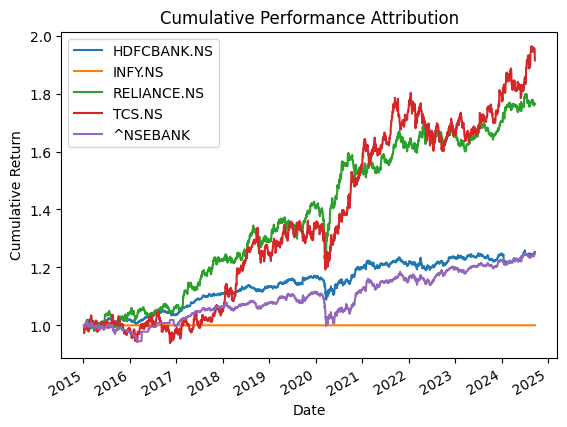

Average Daily Attribution:
HDFCBANK.NS    0.000096
INFY.NS        0.000000
RELIANCE.NS    0.000246
TCS.NS         0.000292
^NSEBANK       0.000096
dtype: float64


In [6]:
def performance_attribution(returns, weights):
    portfolio_return = (returns * weights).sum(axis=1)
    attribution = returns * weights
    cumulative_attribution = (1 + attribution).cumprod()
    return portfolio_return, attribution, cumulative_attribution


optimized_weights = pd.Series(opt_results.x, index=stocks)

portfolio_return, attribution, cumulative_attribution = performance_attribution(returns, optimized_weights)


plt.figure(figsize=(16, 10))
cumulative_attribution.plot()
plt.title('Cumulative Performance Attribution')
plt.xlabel('Date')
plt.ylabel('Cumulative Return')
plt.legend(returns.columns)
plt.show()


print("Average Daily Attribution:")
print(attribution.mean())

In [7]:
def create_dashboard(returns, weights, var_results):
    # Cumulative returns
    cum_returns = (1 + returns).cumprod()

   
    fig = make_subplots(rows=2, cols=2, specs=[[{}, {"type": "domain"}], [{}, {}]],
                        subplot_titles=("Cumulative Returns", "Portfolio Composition",
                                                        "Daily Returns Distribution", "Value at Risk Comparison"))

   
    for stock in stocks:
        fig.add_trace(go.Scatter(x=cum_returns.index, y=cum_returns[stock], name=stock), row=1, col=1)

    
    fig.add_trace(go.Pie(labels=weights.index, values=weights.values), row=1, col=2)

    
    for stock in stocks:
        fig.add_trace(go.Histogram(x=returns[stock], name=stock, opacity=0.7), row=2, col=1)

   
    var_df = pd.DataFrame({
        'Historical': var_historical,
        'Parametric': var_parametric,
        'Monte Carlo': var_monte_carlo
    })
    for method in var_df.columns:
        fig.add_trace(go.Bar(x=var_df.index, y=var_df[method], name=method), row=2, col=2)

    
    fig.update_layout(height=800, width=1200, title_text="Portfolio Analysis Dashboard")
    fig.show()

create_dashboard(returns, optimized_weights, var_historical)

# Multiple assets LSTM

[*********************100%***********************]  4 of 4 completed


There are 4 assets and 2394 trading days in the dataset.


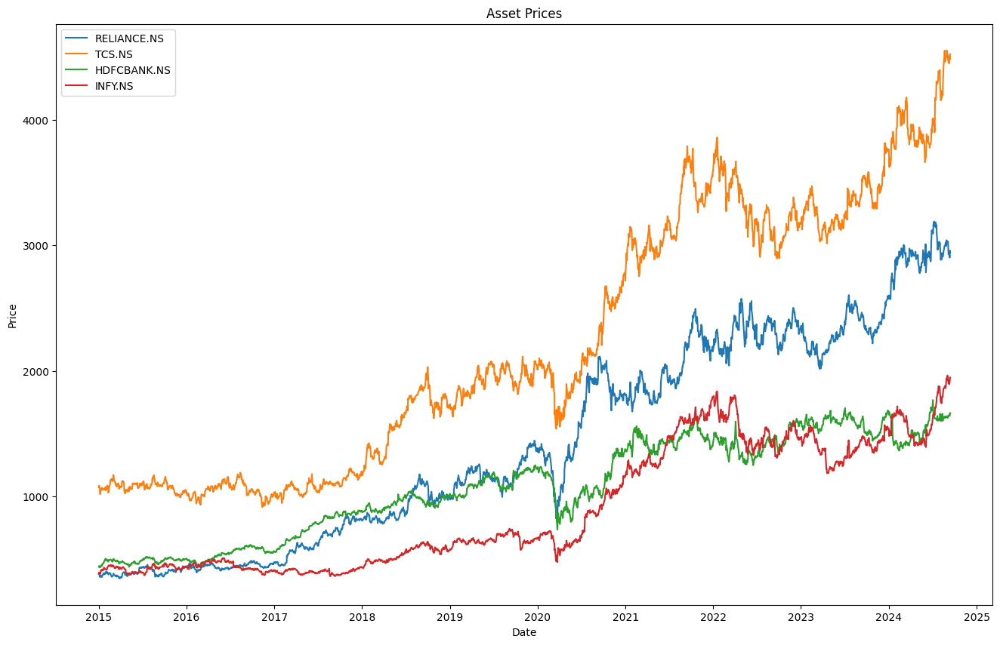

In [16]:
import yfinance as yf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import date
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout
from scipy.optimize import minimize

# Define a list of assets (you can modify this list)
assets = ['RELIANCE.NS', 'TCS.NS', 'HDFCBANK.NS', 'INFY.NS']

# Download data for all assets
data = yf.download(assets, start='2015-01-01', end=date.today())['Adj Close']

print('There are {} assets and {} trading days in the dataset.'.format(len(assets), data.shape[0]))

# Visualize the price trends
plt.figure(figsize=(16, 10))
for asset in assets:
    plt.plot(data.index, data[asset], label=asset)
plt.xlabel('Date')
plt.ylabel('Price')
plt.title('Asset Prices')
plt.legend()
plt.show()

                           HDFCBANK.NS     INFY.NS  RELIANCE.NS       TCS.NS  \
Date                                                                           
2015-01-30 00:00:00+00:00   498.297424  420.353821   393.269165  1048.574219   
2015-02-02 00:00:00+00:00   500.263092  419.362732   390.175476  1062.156250   
2015-02-03 00:00:00+00:00   492.168945  416.232483   402.872681  1080.765869   
2015-02-04 00:00:00+00:00   493.833984  420.540222   399.091400  1062.198486   
2015-02-05 00:00:00+00:00   497.904266  430.539307   396.900055  1078.294556   

                           HDFCBANK.NS_ma7  HDFCBANK.NS_ma21  \
Date                                                           
2015-01-30 00:00:00+00:00       488.207794        462.638064   
2015-02-02 00:00:00+00:00       492.281289        465.491382   
2015-02-03 00:00:00+00:00       495.112588        467.667434   
2015-02-04 00:00:00+00:00       496.757834        470.102276   
2015-02-05 00:00:00+00:00       496.919721        473.0

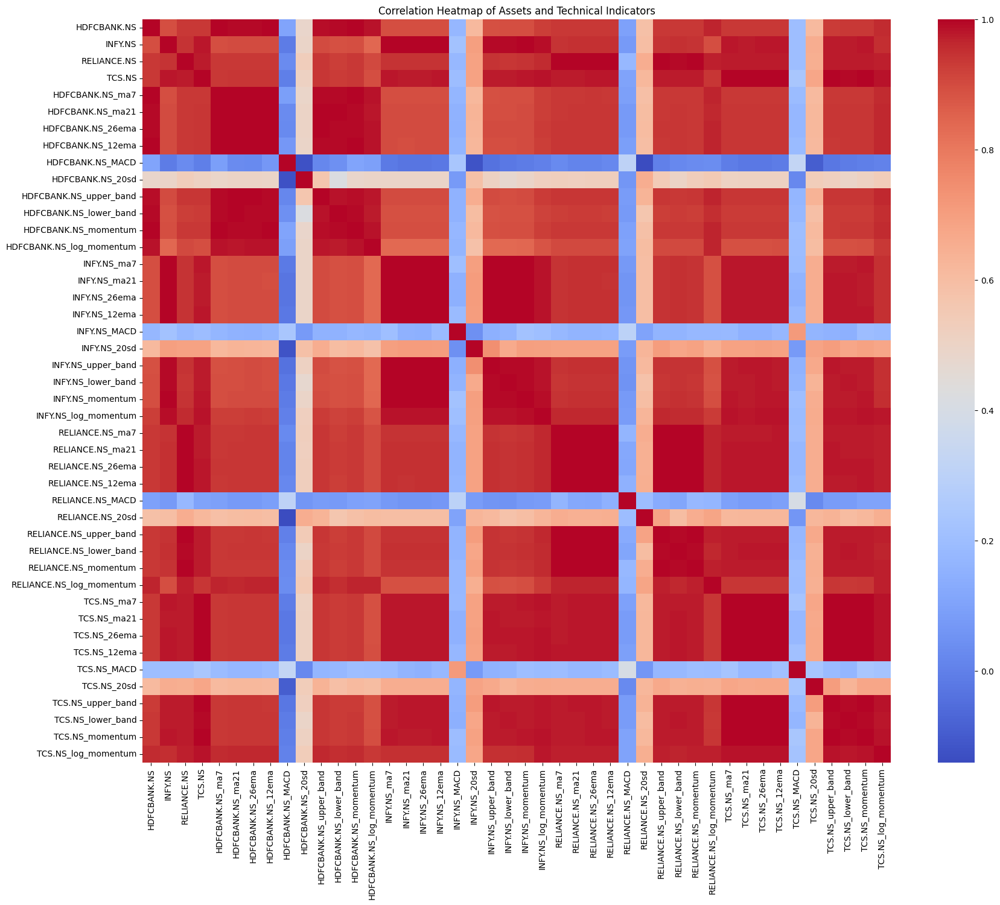

In [17]:
def get_technical_indicators(dataset):
    df = pd.DataFrame(index=dataset.index)
    for asset in dataset.columns:
        # 7 and 21 days Moving Average
        df[f'{asset}_ma7'] = dataset[asset].rolling(window=7).mean()
        df[f'{asset}_ma21'] = dataset[asset].rolling(window=21).mean()

        
        df[f'{asset}_26ema'] = dataset[asset].ewm(span=26).mean()
        df[f'{asset}_12ema'] = dataset[asset].ewm(span=12).mean()
        df[f'{asset}_MACD'] = df[f'{asset}_12ema'] - df[f'{asset}_26ema']

        # Bollinger Bands
        df[f'{asset}_20sd'] = dataset[asset].rolling(window=21).std()
        df[f'{asset}_upper_band'] = df[f'{asset}_ma21'] + (df[f'{asset}_20sd'] * 2)
        df[f'{asset}_lower_band'] = df[f'{asset}_ma21'] - (df[f'{asset}_20sd'] * 2)

        # Momentum
        df[f'{asset}_momentum'] = dataset[asset] - 1
        df[f'{asset}_log_momentum'] = np.log(df[f'{asset}_momentum'])

    return pd.concat([dataset, df], axis=1)

df = get_technical_indicators(data)
df = df.dropna()
print(df.head())

# correlations
plt.figure(figsize=(20, 16))
sns.heatmap(df.corr(), annot=False, cmap='coolwarm')
plt.title('Correlation Heatmap of Assets and Technical Indicators')
plt.show()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/50
53/53 ━━━━━━━━━━━━━━━━━━━━ 17s 174ms/step - loss: 0.0666 - val_loss: 0.0330
Epoch 2/50
53/53 ━━━━━━━━━━━━━━━━━━━━ 11s 187ms/step - loss: 0.0124 - val_loss: 0.0090
Epoch 3/50
53/53 ━━━━━━━━━━━━━━━━━━━━ 11s 201ms/step - loss: 0.0084 - val_loss: 0.0063
Epoch 4/50
53/53 ━━━━━━━━━━━━━━━━━━━━ 11s 201ms/step - loss: 0.0068 - val_loss: 0.0045
Epoch 5/50
53/53 ━━━━━━━━━━━━━━━━━━━━ 20s 200ms/step - loss: 0.0074 - val_loss: 0.0058
Epoch 6/50
53/53 ━━━━━━━━━━━━━━━━━━━━ 20s 201ms/step - loss: 0.0058 - val_loss: 0.0044
Epoch 7/50
53/53 ━━━━━━━━━━━━━━━━━━━━ 20s 186ms/step - loss: 0.0057 - val_loss: 0.0072
Epoch 8/50
53/53 ━━━━━━━━━━━━━━━━━━━━ 11s 202ms/step - loss: 0.0047 - val_loss: 0.0051
Epoch 9/50
53/53 ━━━━━━━━━━━━━━━━━━━━ 19s 173ms/step - loss: 0.0050 - val_loss: 0.0026
Epoch 10/50
53/53 ━━━━━━━━━━━━━━━━━━━━ 10s 168ms/step - loss: 0.0043 - val_loss: 0.0043
Epoch 11/50
53/53 ━━━━━━━━━━━━━━━━━━━━ 12s 203ms/step - loss: 0.0046 - val_loss: 0.0413
Epoch 12/50
53/53 ━━━━━━━━━━━━━━━━━━━━ 20

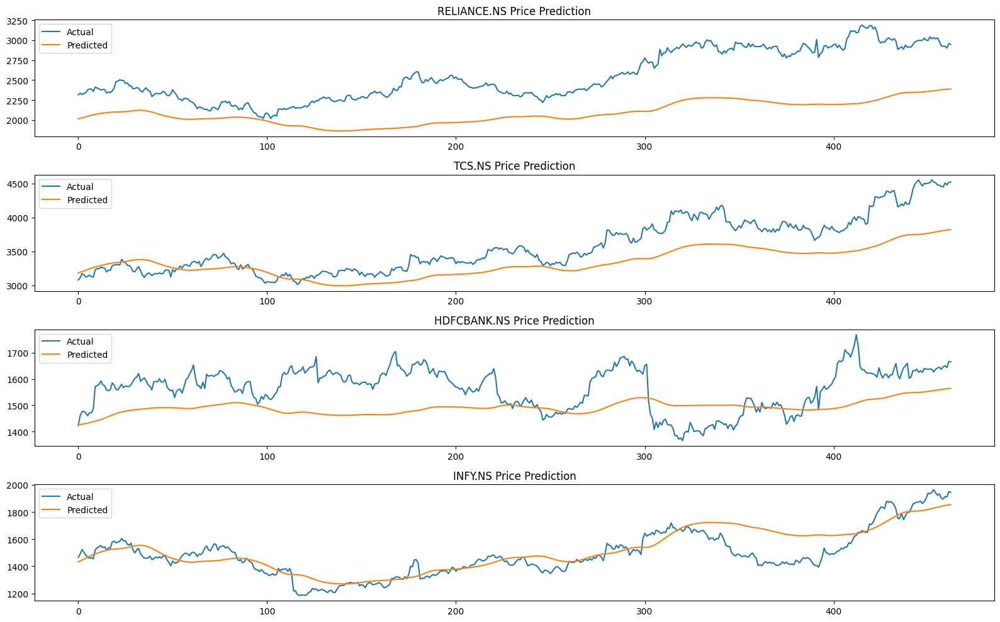

In [18]:
def prepare_data(data, look_back=60):
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(data)

    X, y = [], []
    for i in range(look_back, len(scaled_data)):
        X.append(scaled_data[i-look_back:i])
        y.append(scaled_data[i, :])
    return np.array(X), np.array(y), scaler

def create_model(input_shape):
    model = Sequential()
    model.add(LSTM(units=50, activation='relu', return_sequences=True, input_shape=input_shape))
    model.add(Dropout(0.2))
    model.add(LSTM(units=60, activation='relu', return_sequences=True))
    model.add(Dropout(0.3))
    model.add(LSTM(units=80, activation='relu', return_sequences=True))
    model.add(Dropout(0.4))
    model.add(LSTM(units=120, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(units=len(assets)))
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model


X, y, scaler = prepare_data(df[assets].values)


split = int(0.8 * len(X))
X_train, X_test = X[:split], X[split:]
y_train, y_test = y[:split], y[split:]


model = create_model((X.shape[1], X.shape[2]))
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.1, verbose=1)


y_pred = model.predict(X_test)


y_test_inv = scaler.inverse_transform(y_test)
y_pred_inv = scaler.inverse_transform(y_pred)


plt.figure(figsize=(16, 10))
for i, asset in enumerate(assets):
    plt.subplot(len(assets), 1, i+1)
    plt.plot(y_test_inv[:, i], label='Actual')
    plt.plot(y_pred_inv[:, i], label='Predicted')
    plt.title(f'{asset} Price Prediction')
    plt.legend()
plt.tight_layout()
plt.show()

Optimized Portfolio Weights:
RELIANCE.NS: 0.4453
TCS.NS: 0.2402
HDFCBANK.NS: 0.1108
INFY.NS: 0.2038

Portfolio Performance:
Expected annual return: 0.2140
Annual volatility: 0.1919
Sharpe Ratio: 0.8545


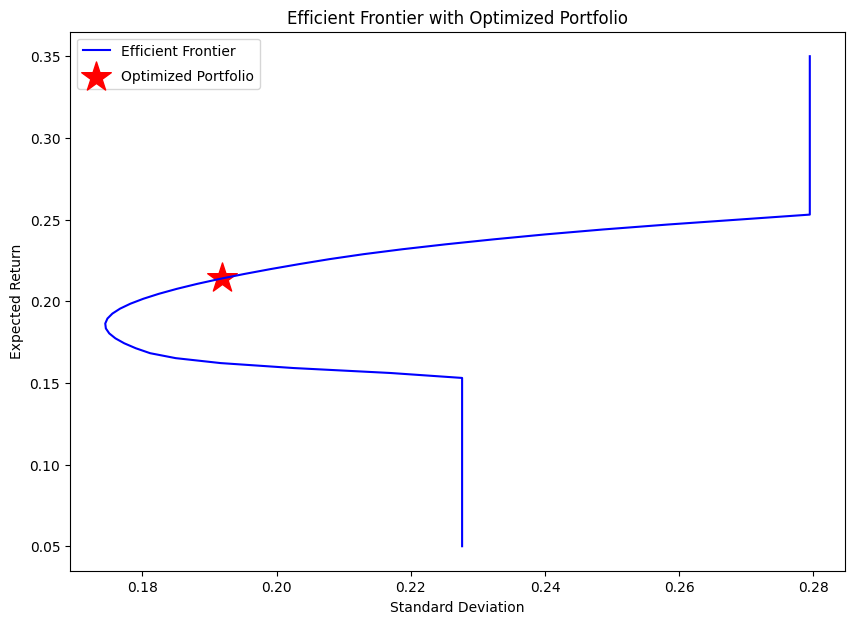

In [19]:
def portfolio_annualized_performance(weights, mean_returns, cov_matrix):
    returns = np.sum(mean_returns * weights) * 252
    std = np.sqrt(np.dot(weights.T, np.dot(cov_matrix, weights))) * np.sqrt(252)
    return std, returns

def neg_sharpe_ratio(weights, mean_returns, cov_matrix, risk_free_rate):
    p_var, p_ret = portfolio_annualized_performance(weights, mean_returns, cov_matrix)
    return -(p_ret - risk_free_rate) / p_var

def optimize_portfolio(mean_returns, cov_matrix, risk_free_rate):
    num_assets = len(mean_returns)
    args = (mean_returns, cov_matrix, risk_free_rate)
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
    bound = (0.0, 1.0)
    bounds = tuple(bound for asset in range(num_assets))
    result = minimize(neg_sharpe_ratio, num_assets*[1./num_assets,], args=args,
                      method='SLSQP', bounds=bounds, constraints=constraints)
    return result

# returns
returns = df[assets].pct_change().dropna()

# mean returns and covariance matrix
mean_returns = returns.mean()
cov_matrix = returns.cov()

# Optimize the portfolio
risk_free_rate = 0.05  #  5% risk-free rate
opt_results = optimize_portfolio(mean_returns, cov_matrix, risk_free_rate)


print("Optimized Portfolio Weights:")
for asset, weight in zip(assets, opt_results.x):
    print(f"{asset}: {weight:.4f}")

#portfolio performance
portfolio_std, portfolio_return = portfolio_annualized_performance(opt_results.x, mean_returns, cov_matrix)
sharpe_ratio = (portfolio_return - risk_free_rate) / portfolio_std

print(f"\nPortfolio Performance:")
print(f"Expected annual return: {portfolio_return:.4f}")
print(f"Annual volatility: {portfolio_std:.4f}")
print(f"Sharpe Ratio: {sharpe_ratio:.4f}")

#efficient frontier
def efficient_frontier(mean_returns, cov_matrix, returns_range):
    efficients = []
    for ret in returns_range:
        constraints = ({'type': 'eq', 'fun': lambda x: portfolio_annualized_performance(x, mean_returns, cov_matrix)[1] - ret},
                       {'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
        result = minimize(lambda x: portfolio_annualized_performance(x, mean_returns, cov_matrix)[0],
                          len(mean_returns)*[1./len(mean_returns),], method='SLSQP', bounds=tuple((0,1) for _ in range(len(mean_returns))),
                          constraints=constraints)
        efficients.append(result['fun'])
    return efficients

returns_range = np.linspace(0.05, 0.35, 100)
efficients = efficient_frontier(mean_returns, cov_matrix, returns_range)

plt.figure(figsize=(10, 7))
plt.plot(efficients, returns_range, 'b', label='Efficient Frontier')
plt.scatter(portfolio_std, portfolio_return, marker='*', color='r', s=500, label='Optimized Portfolio')
plt.title('Efficient Frontier with Optimized Portfolio')
plt.xlabel('Standard Deviation')
plt.ylabel('Expected Return')
plt.legend(labelspacing=0.8)
plt.show()

## Multi-Asset Analysis and Prediction
* Extend the LSTM model to predict multiple asset prices simultaneously
* Implement a more advanced ensemble model (e.g., combining LSTM with XGBoost and Random Forest)

In [3]:
import numpy as np
import pandas as pd
import yfinance as yf
from datetime import date
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam

In [4]:
# Define a list of assets
assets = ['RELIANCE.NS', 'TCS.NS', 'HDFCBANK.NS', 'INFY.NS']

# Download data
data = yf.download(assets, start='2010-01-01', end=date.today())['Adj Close']

print(data.head())
print(f"\nShape of the data: {data.shape}")

[*********************100%***********************]  4 of 4 completed

Ticker                     HDFCBANK.NS     INFY.NS  RELIANCE.NS      TCS.NS
Date                                                                       
2010-01-04 00:00:00+00:00   151.915070  237.103012   438.932251  289.102356
2010-01-05 00:00:00+00:00   152.048676  237.897079   436.973267  289.179230
2010-01-06 00:00:00+00:00   152.151108  234.425705   444.033722  282.640717
2010-01-07 00:00:00+00:00   152.547440  229.157486   451.400238  274.775146
2010-01-08 00:00:00+00:00   152.747849  223.635101   450.216766  269.159637

Shape of the data: (3627, 4)


In [5]:
def prepare_data(data, look_back=60):
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(data)

    X, y = [], []
    for i in range(look_back, len(scaled_data)):
        X.append(scaled_data[i-look_back:i])
        y.append(scaled_data[i])

    return np.array(X), np.array(y), scaler

X, y, scaler = prepare_data(data)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f"Training set shape: {X_train.shape}")
print(f"Testing set shape: {X_test.shape}")

Training set shape: (2853, 60, 4)
Testing set shape: (714, 60, 4)


In [6]:
def create_lstm_model(input_shape, output_shape):
    model = Sequential([
        LSTM(100, return_sequences=True, input_shape=input_shape),
        Dropout(0.2),
        LSTM(100, return_sequences=False),
        Dropout(0.2),
        Dense(50),
        Dense(output_shape)
    ])

    model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')
    return model

lstm_model = create_lstm_model((X_train.shape[1], X_train.shape[2]), y_train.shape[1])
lstm_history = lstm_model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.1, verbose=1)


lstm_predictions = lstm_model.predict(X_test)


lstm_predictions = scaler.inverse_transform(lstm_predictions)
y_test_inv = scaler.inverse_transform(y_test)


lstm_rmse = np.sqrt(np.mean((lstm_predictions - y_test_inv)**2, axis=0))
print("LSTM RMSE for each asset:")
for asset, rmse in zip(assets, lstm_rmse):
    print(f"{asset}: {rmse:.2f}")

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.0310 - val_loss: 8.4579e-04
Epoch 2/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0027 - val_loss: 5.7864e-04
Epoch 3/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0020 - val_loss: 6.5528e-04
Epoch 4/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0017 - val_loss: 5.3945e-04
Epoch 5/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0014 - val_loss: 4.5023e-04
Epoch 6/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0014 - val_loss: 6.8141e-04
Epoch 7/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0012 - val_loss: 3.9515e-04
Epoch 8/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0011 - val_loss: 5.0944e-04
Epoch 9/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0010 - val_loss: 4.7590e-04
Epoch 10/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 9.9492e-04 - val_loss: 6.7976e-04
Epoch 11/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0011 - val_loss: 4.5208e-04
Epoch 12/50
81/81 ━━━━━

In [7]:
def prepare_data_for_tree_models(data, look_back=60):
    X, y = [], []
    for i in range(look_back, len(data)):
        X.append(data[i-look_back:i].values.flatten())
        y.append(data.iloc[i].values)
    return np.array(X), np.array(y)

X_tree, y_tree = prepare_data_for_tree_models(data)
X_train_tree, X_test_tree, y_train_tree, y_test_tree = train_test_split(X_tree, y_tree, test_size=0.2, random_state=42)

# XGBoost model
xgb_model = XGBRegressor(n_estimators=100, learning_rate=0.08, gamma=0, subsample=0.75,
                         colsample_bytree=1, max_depth=7)
xgb_model.fit(X_train_tree, y_train_tree)

# Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train_tree, y_train_tree)

# both predictions
xgb_predictions = xgb_model.predict(X_test_tree)
rf_predictions = rf_model.predict(X_test_tree)


xgb_rmse = np.sqrt(np.mean((xgb_predictions - y_test_tree)**2, axis=0))
rf_rmse = np.sqrt(np.mean((rf_predictions - y_test_tree)**2, axis=0))

print("\nXGBoost RMSE for each asset:")
for asset, rmse in zip(assets, xgb_rmse):
    print(f"{asset}: {rmse:.2f}")

print("\nRandom Forest RMSE for each asset:")
for asset, rmse in zip(assets, rf_rmse):
    print(f"{asset}: {rmse:.2f}")


XGBoost RMSE for each asset:
RELIANCE.NS: 12.92
TCS.NS: 13.70
HDFCBANK.NS: 22.84
INFY.NS: 29.22

Random Forest RMSE for each asset:
RELIANCE.NS: 14.81
TCS.NS: 14.59
HDFCBANK.NS: 24.05
INFY.NS: 28.59


In [8]:
def ensemble_predictions(lstm_pred, xgb_pred, rf_pred, weights=[0.3, 0.4, 0.3]):
    return weights[0] * lstm_pred + weights[1] * xgb_pred + weights[2] * rf_pred

ensemble_predictions = ensemble_predictions(lstm_predictions, xgb_predictions, rf_predictions)

# rmse for the ensemble model
ensemble_rmse = np.sqrt(np.mean((ensemble_predictions - y_test_inv)**2, axis=0))

print("\nEnsemble Model RMSE for each asset:")
for asset, rmse in zip(assets, ensemble_rmse):
    print(f"{asset}: {rmse:.2f}")


Ensemble Model RMSE for each asset:
RELIANCE.NS: 13.38
TCS.NS: 13.80
HDFCBANK.NS: 24.72
INFY.NS: 32.27


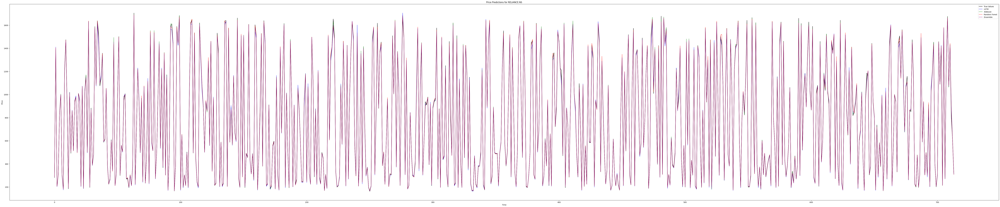

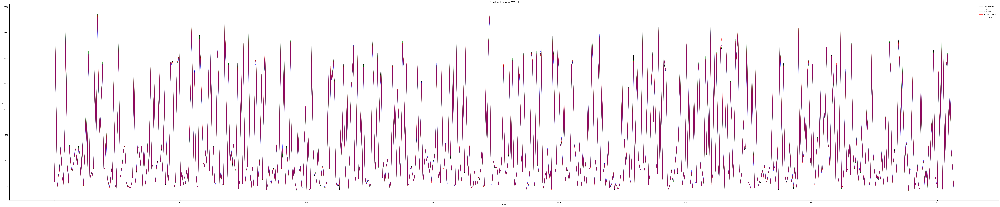

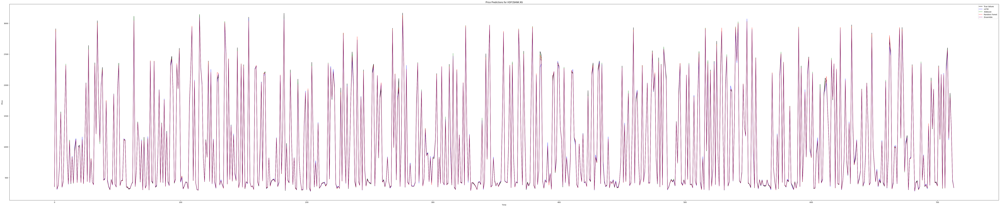

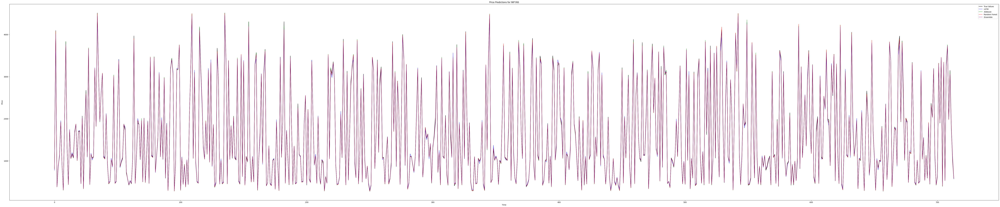

In [12]:
def plot_predictions(true_values, lstm_pred, xgb_pred, rf_pred, ensemble_pred, asset_name):
    plt.figure(figsize=(100, 20))
    plt.plot(true_values, label='True Values', color='black')
    plt.plot(lstm_pred, label='LSTM', color='blue', alpha=0.7)
    plt.plot(xgb_pred, label='XGBoost', color='green', alpha=0.7)
    plt.plot(rf_pred, label='Random Forest', color='red', alpha=0.7)
    plt.plot(ensemble_pred, label='Ensemble', color='purple', alpha=0.7)
    plt.title(f'Price Predictions for {asset_name}')
    plt.xlabel('Time')
    plt.ylabel('Price')
    plt.legend()
    plt.show()

for i, asset in enumerate(assets):
    plot_predictions(y_test_inv[:, i], lstm_predictions[:, i], xgb_predictions[:, i],
                     rf_predictions[:, i], ensemble_predictions[:, i], asset)

## Advanced Risk Management
* Implement multiple VaR calculation methods (Historical, Parametric, Monte Carlo)
* Add Expected Shortfall (ES) / Conditional VaR (CVaR) calculations
* Develop a comprehensive stress testing framework

In [13]:
import numpy as np
import pandas as pd
import yfinance as yf
from scipy import stats
from datetime import date
import matplotlib.pyplot as plt
import seaborn as sns


assets = ['RELIANCE.NS', 'TCS.NS', 'HDFCBANK.NS', 'INFY.NS']
data = yf.download(assets, start='2010-01-01', end=date.today())['Adj Close']
returns = data.pct_change().dropna()

print(returns.head())
print(f"\nShape of the returns data: {returns.shape}")

[*********************100%***********************]  4 of 4 completed

Ticker                     HDFCBANK.NS   INFY.NS  RELIANCE.NS    TCS.NS
Date                                                                   
2010-01-05 00:00:00+00:00     0.000879  0.003349    -0.004463  0.000266
2010-01-06 00:00:00+00:00     0.000674 -0.014592     0.016158 -0.022611
2010-01-07 00:00:00+00:00     0.002605 -0.022473     0.016590 -0.027829
2010-01-08 00:00:00+00:00     0.001314 -0.024099    -0.002622 -0.020437
2010-01-11 00:00:00+00:00    -0.004023  0.010328    -0.019626  0.020577

Shape of the returns data: (3626, 4)


            Historical_VaR Parametric_VaR Monte Carlo_VaR Historical_ES  \
RELIANCE.NS      -0.025364      -0.027829       -0.027787      0.036382   
TCS.NS           -0.023105      -0.024889       -0.024664      0.033809   
HDFCBANK.NS      -0.021051       -0.02342       -0.023634      0.031961   
INFY.NS          -0.023128      -0.027425       -0.027047      0.038095   

            Parametric_ES Monte Carlo_ES  
RELIANCE.NS      0.039651       0.039737  
TCS.NS           0.036282        0.03512  
HDFCBANK.NS      0.034911       0.034429  
INFY.NS          0.046551       0.046727  


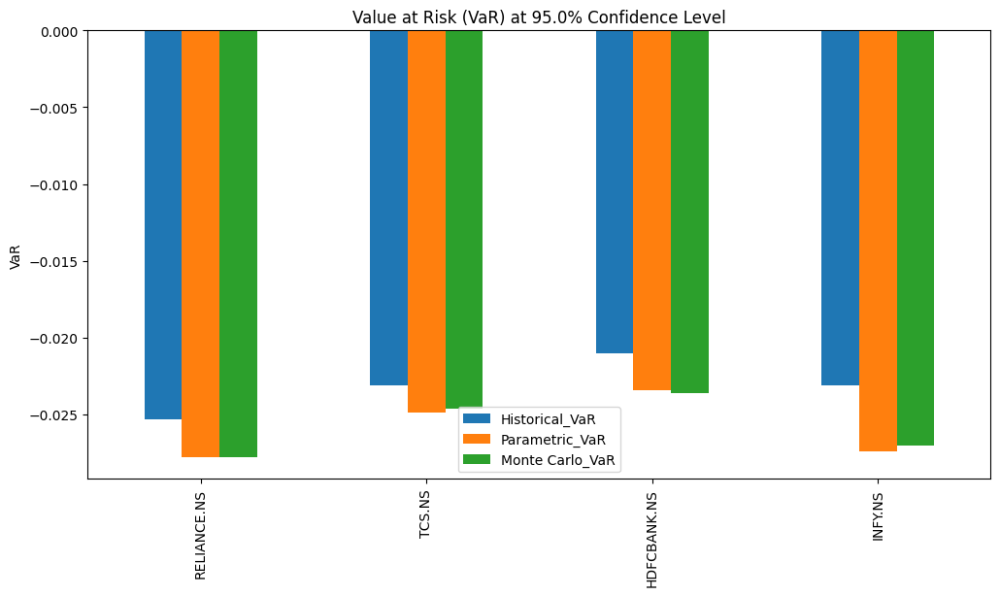

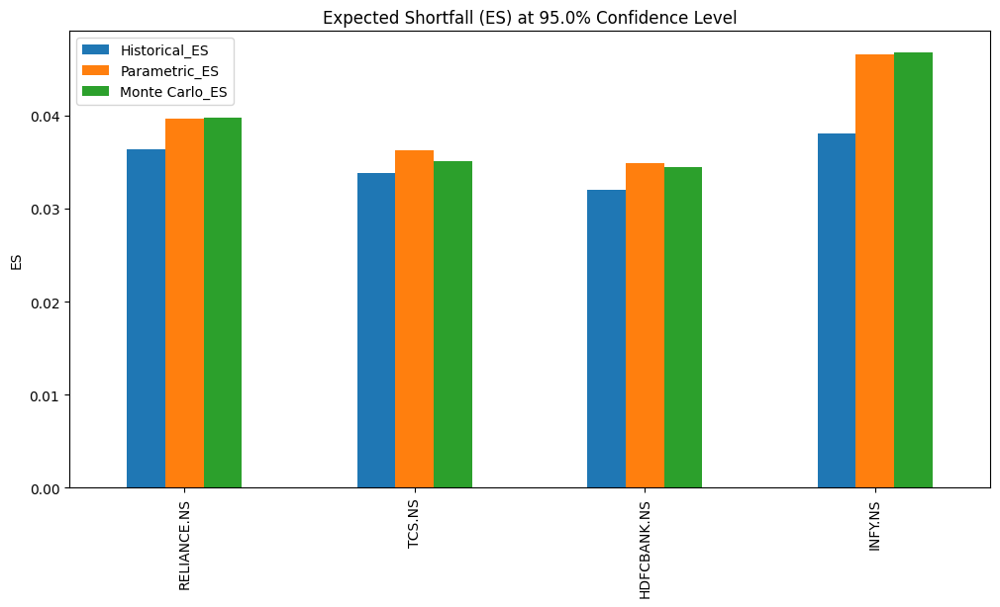

In [14]:
# Diffrent VaR
def calculate_var(returns, confidence_level, method='Historical'):
    if method == 'Historical':
        return np.percentile(returns, 100 * (1 - confidence_level))
    elif method == 'Parametric':
        mean = np.mean(returns)
        std = np.std(returns)
        return stats.norm.ppf(1 - confidence_level, mean, std)
    elif method == 'Monte Carlo':
        mean = np.mean(returns)
        std = np.std(returns)
        simulations = 10000
        sim_returns = np.random.normal(mean, std, simulations)
        return np.percentile(sim_returns, 100 * (1 - confidence_level))

def calculate_es(returns, confidence_level, method='Historical'):
    var = calculate_var(returns, confidence_level, method)
    return -returns[returns <= var].mean()

# VaR and ES for each asset
confidence_level = 0.95
var_methods = ['Historical', 'Parametric', 'Monte Carlo']
risk_metrics = pd.DataFrame(index=assets, columns=[f'{m}_VaR' for m in var_methods] + [f'{m}_ES' for m in var_methods])

for asset in assets:
    for method in var_methods:
        var = calculate_var(returns[asset], confidence_level, method)
        es = calculate_es(returns[asset], confidence_level, method)
        risk_metrics.loc[asset, f'{method}_VaR'] = var
        risk_metrics.loc[asset, f'{method}_ES'] = es

print(risk_metrics)


plt.figure(figsize=(12, 6))
risk_metrics[[f'{m}_VaR' for m in var_methods]].plot(kind='bar', ax=plt.gca())
plt.title(f'Value at Risk (VaR) at {confidence_level*100}% Confidence Level')
plt.ylabel('VaR')
plt.show()

plt.figure(figsize=(12, 6))
risk_metrics[[f'{m}_ES' for m in var_methods]].plot(kind='bar', ax=plt.gca())
plt.title(f'Expected Shortfall (ES) at {confidence_level*100}% Confidence Level')
plt.ylabel('ES')
plt.show()


Stress Test Results:
             Mild Recession  Severe Recession  Market Crash  Tech Boom  \
RELIANCE.NS       -0.029325         -0.069325     -0.149325   0.050675   
TCS.NS            -0.029119         -0.069119     -0.149119   0.050881   
HDFCBANK.NS       -0.029231         -0.069231     -0.149231   0.050769   
INFY.NS           -0.029272         -0.069272     -0.149272   0.050728   

             Economic Boom  
RELIANCE.NS       0.080675  
TCS.NS            0.080881  
HDFCBANK.NS       0.080769  
INFY.NS           0.080728  


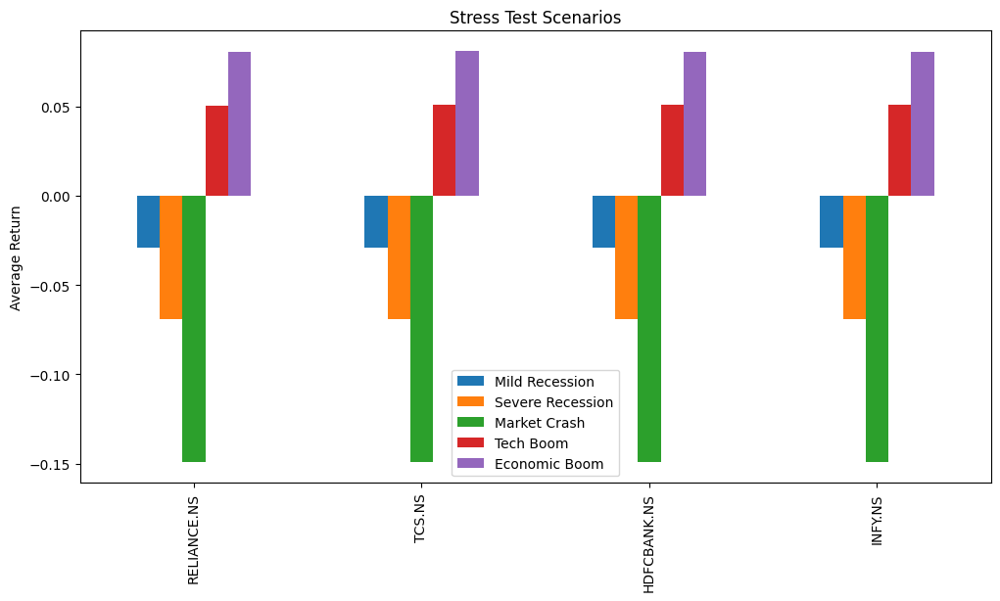

In [15]:
def stress_test(returns, scenarios):
    results = pd.DataFrame(index=assets, columns=scenarios.keys())
    for scenario, shock in scenarios.items():
        stressed_returns = returns + shock
        results[scenario] = stressed_returns.mean()
    return results

#  stress test scenarios
scenarios = {
    'Mild Recession': -0.03,
    'Severe Recession': -0.07,
    'Market Crash': -0.15,
    'Tech Boom': 0.05,
    'Economic Boom': 0.08
}

stress_test_results = stress_test(returns, scenarios)

print("\nStress Test Results:")
print(stress_test_results)


plt.figure(figsize=(12, 6))
stress_test_results.plot(kind='bar', ax=plt.gca())
plt.title('Stress Test Scenarios')
plt.ylabel('Average Return')
plt.show()

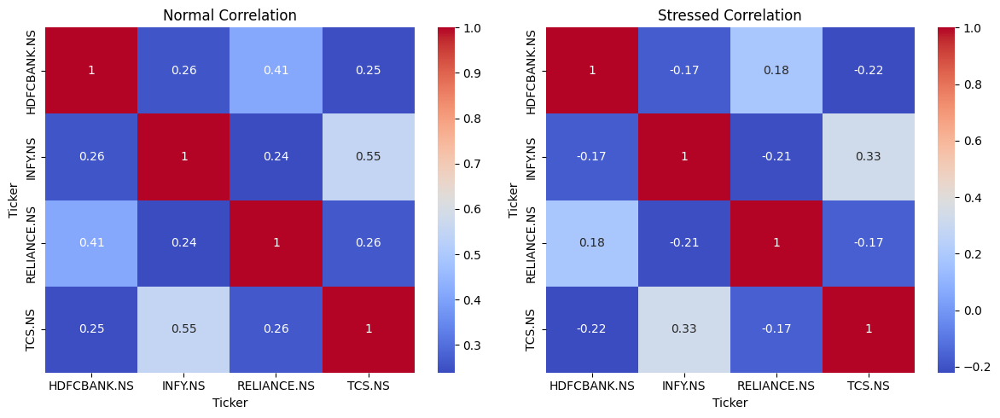

In [16]:
 #analysis to understand how assets behave together under stress

def correlation_stress_test(returns, stress_factor=1.5):
    normal_corr = returns.corr()

    # periods of stress  when returns are below their 5th percentile)
    stress_periods = returns < returns.quantile(0.05)
    stressed_returns = returns[stress_periods.any(axis=1)]

    # stressed correlation
    stressed_corr = stressed_returns.corr()

   
    amplified_corr = normal_corr + (stressed_corr - normal_corr) * stress_factor

    return normal_corr, amplified_corr

normal_corr, stressed_corr = correlation_stress_test(returns)

plt.figure(figsize=(12, 5))
plt.subplot(121)
sns.heatmap(normal_corr, annot=True, cmap='coolwarm')
plt.title('Normal Correlation')

plt.subplot(122)
sns.heatmap(stressed_corr, annot=True, cmap='coolwarm')
plt.title('Stressed Correlation')

plt.tight_layout()
plt.show()


Monte Carlo Portfolio VaR: 18409.09
Monte Carlo Portfolio ES: 23042.28


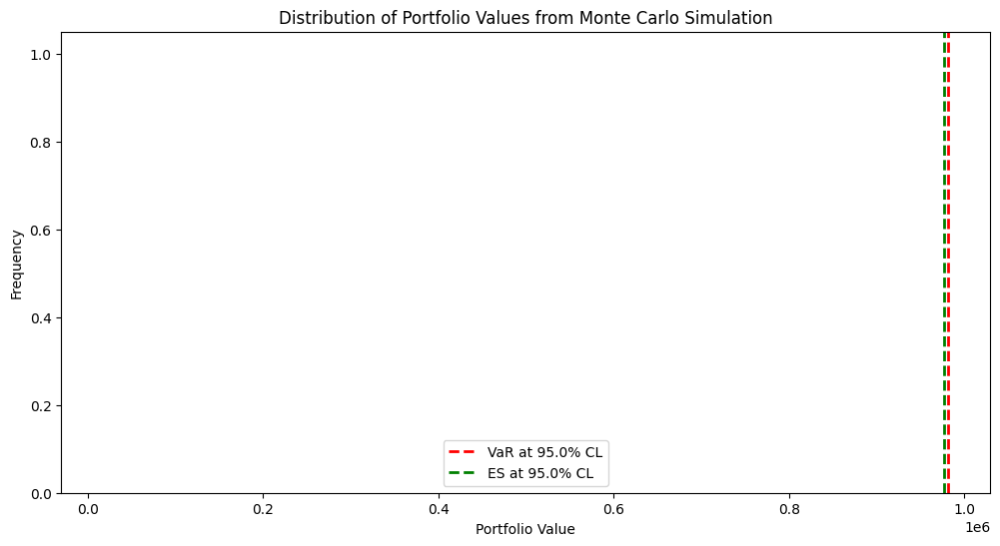

In [17]:
def monte_carlo_var(returns, weights, confidence_level, n_simulations=10000, n_days=1):
    portfolio_returns = returns.dot(weights)
    mean_return = portfolio_returns.mean()
    std_return = portfolio_returns.std()

    simulation_returns = np.random.normal(mean_return, std_return, n_simulations) * np.sqrt(n_days)
    portfolio_value = 1000000  # initial portfolio value of 1 million
    simulated_values = portfolio_value * (1 + simulation_returns)

    var = portfolio_value - np.percentile(simulated_values, 100 * (1 - confidence_level))
    es = portfolio_value - simulated_values[simulated_values <= (portfolio_value - var)].mean()

    return var, es

#equal weights for simplicity
weights = np.array([1/len(assets)] * len(assets))

var_mc, es_mc = monte_carlo_var(returns, weights, confidence_level)

print(f"\nMonte Carlo Portfolio VaR: {var_mc:.2f}")
print(f"Monte Carlo Portfolio ES: {es_mc:.2f}")


plt.figure(figsize=(12, 6))
plt.hist(monte_carlo_var(returns, weights, confidence_level, n_simulations=100000)[0], bins=100)
plt.title('Distribution of Portfolio Values from Monte Carlo Simulation')
plt.xlabel('Portfolio Value')
plt.ylabel('Frequency')
plt.axvline(1000000 - var_mc, color='r', linestyle='dashed', linewidth=2, label=f'VaR at {confidence_level*100}% CL')
plt.axvline(1000000 - es_mc, color='g', linestyle='dashed', linewidth=2, label=f'ES at {confidence_level*100}% CL')
plt.legend()
plt.show()